#Introduction to Fourier Transform

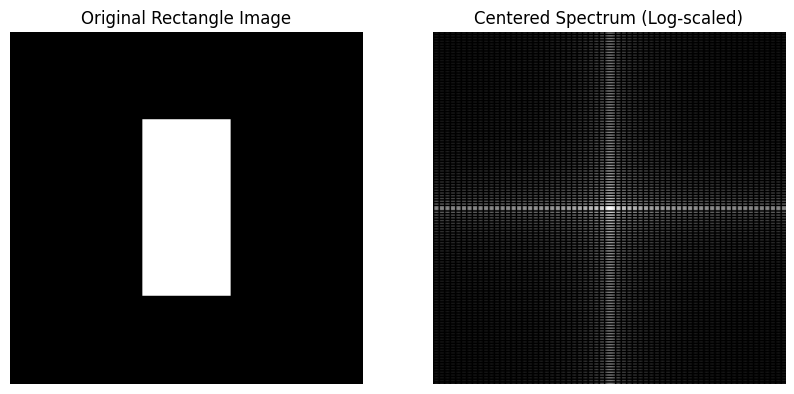

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift

# Create a rectangular image (binary image)
image = np.zeros((256, 256))  # Initialize a 256x256 black image (all zeros)
image[64:192, 96:160] = 1     # Create a white rectangle within the image by setting a region to 1

# Step 1: Compute the Fourier Transform
ft_image = fft2(image)  # Apply 2D Fast Fourier Transform (FFT) to the image

# Step 2: Compute the magnitude of the spectrum (for visualization)
spectrum = np.abs(ft_image)  # Take the magnitude (absolute value) of the complex FFT result

# Step 3: Center the spectrum (shift low frequencies to the center)
spectrum_centered = fftshift(spectrum)  # Shift the zero frequency component to the center of the spectrum

# Step 4: Apply log transformation for better visualization
spectrum_log = np.log(1 + spectrum_centered)  # Apply logarithmic transformation to compress range of values

# Normalize the spectrum to the range [0, 255] for display
spectrum_log_normalized = 255 * (spectrum_log - np.min(spectrum_log)) / (np.max(spectrum_log) - np.min(spectrum_log))

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(10, 5))  # Create two subplots side by side

# Plot original image
ax[0].imshow(image, cmap='gray')  # Display the original binary image
ax[0].set_title("Original Rectangle Image")  # Title for the original image
ax[0].axis('off')  # Turn off axis for clean display

# Plot centered spectrum
ax[1].imshow(spectrum_log_normalized, cmap='gray')  # Display the normalized log-transformed spectrum
ax[1].set_title("Centered Spectrum (Log-scaled)")  # Title for the spectrum plot
ax[1].axis('off')  # Turn off axis for clean display

# Show the final result
plt.show()  # Render the plots


# Ideal High-pass Filter (HPF)

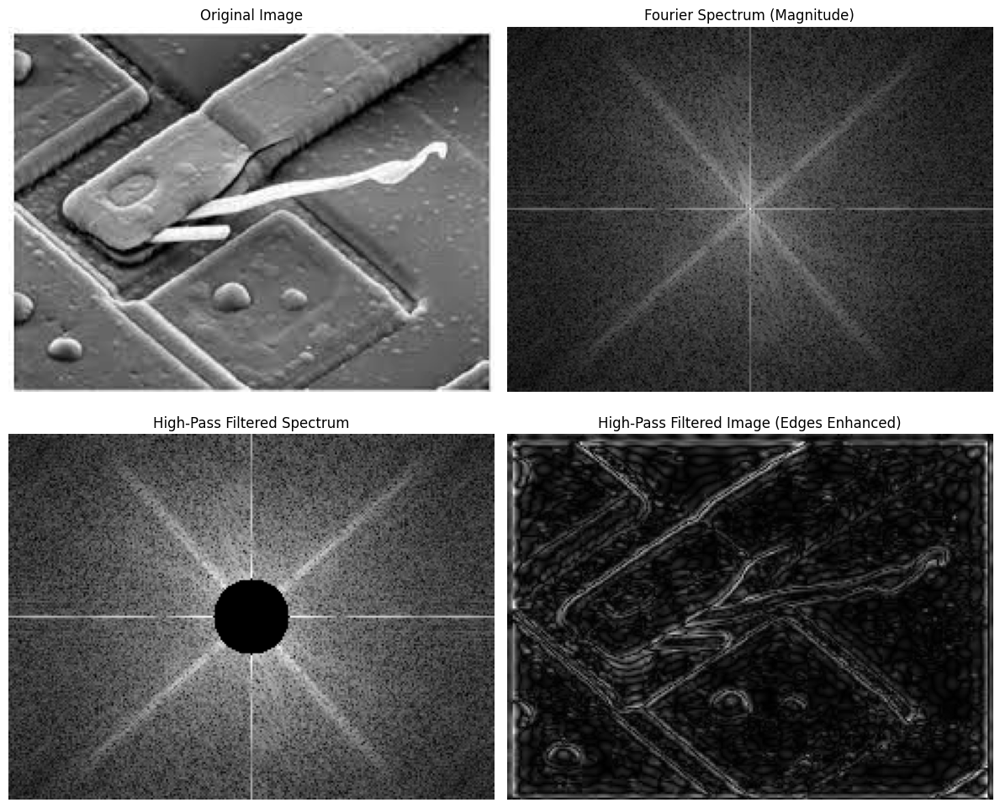

In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift
from skimage import io, color

# Step 1: Load a custom image
image = io.imread("images2.jpeg")  # Load your custom image (replace with your image path)
image = color.rgb2gray(image)  # Convert to grayscale if the image is in RGB

# Step 2: Compute the 2D Fourier Transform of the image
ft_image = fft2(image)  # Compute 2D Fourier Transform

# Step 3: Shift the Fourier transform to center the low frequencies
ft_image_shifted = fftshift(ft_image)  # Shift low frequencies to the center

# Step 4: Compute the magnitude spectrum for visualization
magnitude_spectrum = np.log(1 + np.abs(ft_image_shifted))  # Log transform for better visualization

# Step 5: Create a high-pass circular mask to remove low frequencies (for edge enhancement)
rows, cols = image.shape  # Get the dimensions of the image
crow, ccol = rows // 2, cols // 2  # Find the center of the frequency domain

# Set a cutoff frequency for the high-pass filter (radius of the circle)
cutoff_frequency = 20

# Create a circular mask that removes low frequencies (1 outside the circle, 0 inside)
Y, X = np.ogrid[:rows, :cols]  # Create a grid of Y and X coordinates
distance_from_center = np.sqrt((X - ccol)**2 + (Y - crow)**2)  # Compute distance from the center
mask = np.ones((rows, cols))  # Initialize the mask with ones (allow all frequencies)
mask[distance_from_center <= cutoff_frequency] = 0  # Set low frequencies (within cutoff) to zero

# Apply the high-pass filter in the frequency domain
ft_image_filtered = ft_image_shifted * mask  # Multiply the shifted Fourier Transform by the mask

# Step 6: Inverse Fourier Transform to get the filtered image back in the spatial domain
filtered_image = np.abs(ifft2(fftshift(ft_image_filtered)))  # Inverse FFT and take the magnitude

# Plotting
fig, ax = plt.subplots(2, 2, figsize=(12, 10))  # 2x2 grid for the plots

# Show the original grayscale image
ax[0, 0].imshow(image, cmap='gray')  # Display original image
ax[0, 0].set_title('Original Image')  # Title for the original image
ax[0, 0].axis('off')  # Turn off the axes for clarity

# Show the Fourier magnitude spectrum
ax[0, 1].imshow(magnitude_spectrum, cmap='gray')  # Display the log-scaled Fourier spectrum
ax[0, 1].set_title('Fourier Spectrum (Magnitude)')  # Title for the spectrum
ax[0, 1].axis('off')  # Turn off the axes

# Show the high-pass filtered Fourier spectrum
ax[1, 0].imshow(np.log(1 + np.abs(ft_image_filtered)), cmap='gray')  # Display the filtered Fourier spectrum
ax[1, 0].set_title('High-Pass Filtered Spectrum')  # Title for the filtered spectrum
ax[1, 0].axis('off')  # Turn off the axes

# Show the high-pass filtered image (edge-enhanced)
ax[1, 1].imshow(filtered_image, cmap='gray')  # Display the high-pass filtered image
ax[1, 1].set_title('High-Pass Filtered Image (Edges Enhanced)')  # Title for the filtered image
ax[1, 1].axis('off')  # Turn off the axes

plt.tight_layout()  # Adjust spacing between plots
plt.show()  # Display the plots


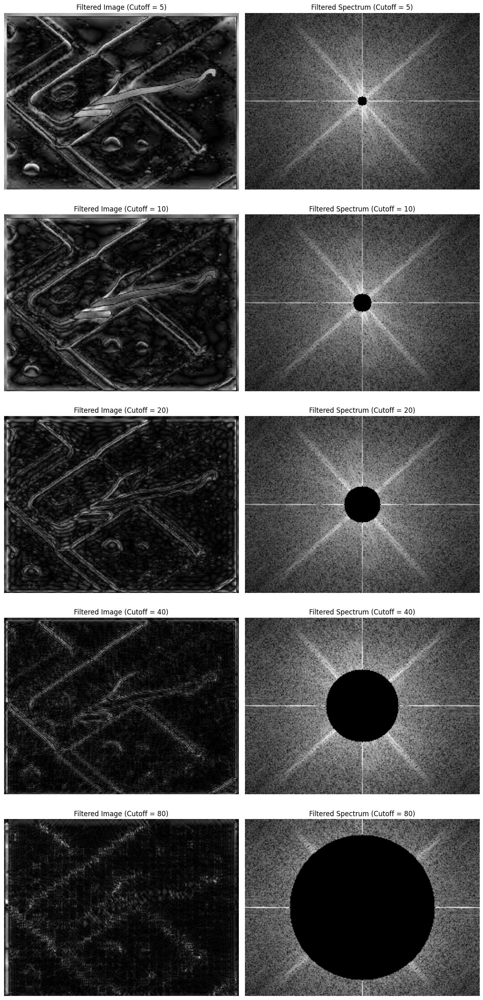

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift
from skimage import io, color

# Step 1: Load a custom image
image = io.imread("images2.jpeg")  # Load your custom image (replace with your image path)
image = color.rgb2gray(image)  # Convert to grayscale if the image is in RGB

# Step 2: Compute the 2D Fourier Transform of the image
ft_image = fft2(image)  # Compute 2D Fourier Transform

# Step 3: Shift the Fourier transform to center the low frequencies
ft_image_shifted = fftshift(ft_image)  # Shift low frequencies to the center

# Step 4: Compute the magnitude spectrum for visualization
magnitude_spectrum = np.log(1 + np.abs(ft_image_shifted))  # Log transform for better visualization

# Step 5: Apply high-pass filters with different cutoff frequencies and visualize results
cutoff_frequencies = [5, 10, 20, 40, 80]  # Different cutoff radii for the circular mask

# Create a figure with a row for each cutoff frequency (2 columns: filtered image and spectrum)
fig, ax = plt.subplots(len(cutoff_frequencies), 2, figsize=(12, len(cutoff_frequencies) * 5))

for i, cutoff_frequency in enumerate(cutoff_frequencies):
    rows, cols = image.shape  # Get the dimensions of the image
    crow, ccol = rows // 2, cols // 2  # Find the center of the frequency domain

    # Create a circular mask that removes low frequencies (1 outside the circle, 0 inside)
    Y, X = np.ogrid[:rows, :cols]  # Create a grid of Y and X coordinates
    distance_from_center = np.sqrt((X - ccol)**2 + (Y - crow)**2)  # Compute distance from the center
    mask = np.ones((rows, cols))  # Initialize the mask with ones (allow all frequencies)
    mask[distance_from_center <= cutoff_frequency] = 0  # Set low frequencies (within cutoff) to zero

    # Apply the high-pass filter in the frequency domain
    ft_image_filtered = ft_image_shifted * mask  # Multiply the shifted Fourier Transform by the mask

    # Step 6: Inverse Fourier Transform to get the filtered image back in the spatial domain
    filtered_image = np.abs(ifft2(fftshift(ft_image_filtered)))  # Inverse FFT and take the magnitude

    # Show the high-pass filtered image (edge-enhanced)
    ax[i, 0].imshow(filtered_image, cmap='gray')  # Display the high-pass filtered image
    ax[i, 0].set_title(f'Filtered Image (Cutoff = {cutoff_frequency})')  # Title for filtered image
    ax[i, 0].axis('off')  # Turn off axes

    # Show the high-pass filtered Fourier spectrum
    ax[i, 1].imshow(np.log(1 + np.abs(ft_image_filtered)), cmap='gray')  # Display the filtered Fourier spectrum
    ax[i, 1].set_title(f'Filtered Spectrum (Cutoff = {cutoff_frequency})')  # Title for filtered spectrum
    ax[i, 1].axis('off')  # Turn off axes

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()  # Display the plots


# Ideal Low-pass Filter (LPF)

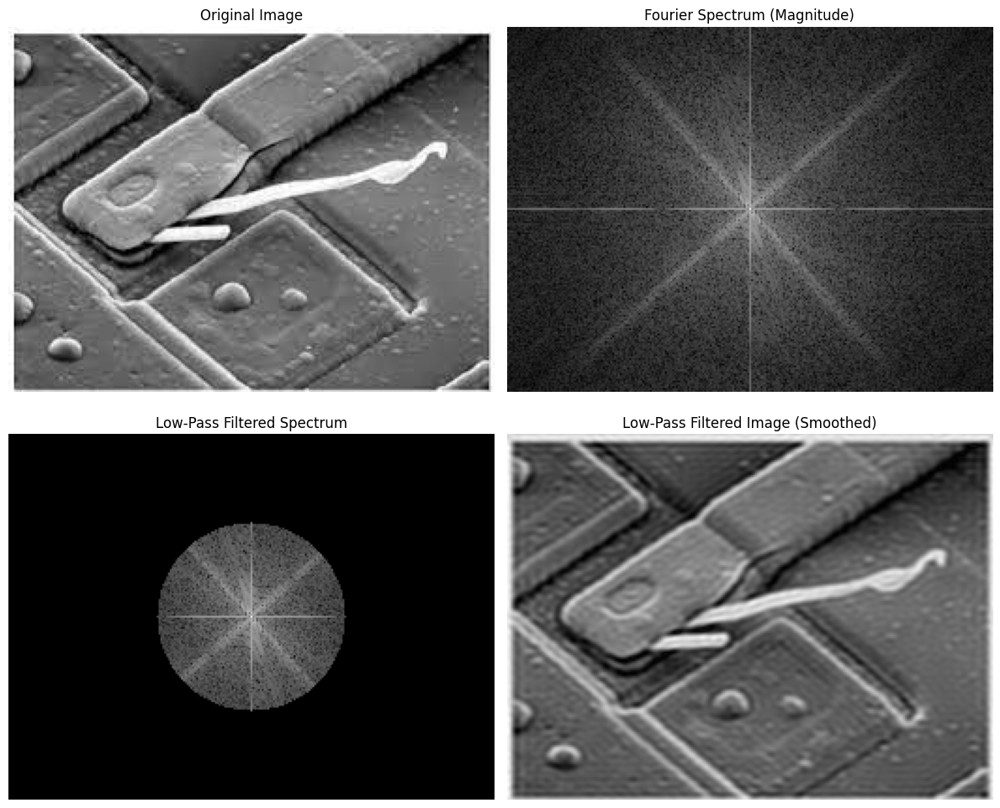

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift
from skimage import io, color

# Step 1: Load a custom image
image = io.imread("images2.jpeg")  # Load your custom image (replace with your image path)
image = color.rgb2gray(image)  # Convert to grayscale if the image is in RGB

# Step 2: Compute the 2D Fourier Transform of the image
ft_image = fft2(image)  # Compute 2D Fourier Transform

# Step 3: Shift the Fourier transform to center the low frequencies
ft_image_shifted = fftshift(ft_image)  # Shift low frequencies to the center

# Step 4: Compute the magnitude spectrum for visualization
magnitude_spectrum = np.log(1 + np.abs(ft_image_shifted))  # Log transform for better visualization

# Step 5: Create a low-pass circular mask to retain low frequencies (for smoothing)
rows, cols = image.shape  # Get the dimensions of the image
crow, ccol = rows // 2, cols // 2  # Find the center of the frequency domain

# Set a cutoff frequency for the low-pass filter (radius of the circle)
cutoff_frequency = 50

# Create a circular mask that retains low frequencies (1 inside the circle, 0 outside)
Y, X = np.ogrid[:rows, :cols]  # Create a grid of Y and X coordinates
distance_from_center = np.sqrt((X - ccol)**2 + (Y - crow)**2)  # Compute distance from the center
mask = np.zeros((rows, cols))  # Initialize the mask with zeros (block all frequencies)
mask[distance_from_center <= cutoff_frequency] = 1  # Set frequencies within cutoff to one

# Apply the low-pass filter in the frequency domain
ft_image_filtered = ft_image_shifted * mask  # Multiply the shifted Fourier Transform by the mask

# Step 6: Inverse Fourier Transform to get the filtered image back in the spatial domain
filtered_image = np.abs(ifft2(fftshift(ft_image_filtered)))  # Inverse FFT and take the magnitude

# Plotting
fig, ax = plt.subplots(2, 2, figsize=(12, 10))  # 2x2 grid for the plots

# Show the original grayscale image
ax[0, 0].imshow(image, cmap='gray')  # Display original image
ax[0, 0].set_title('Original Image')  # Title for the original image
ax[0, 0].axis('off')  # Turn off the axes for clarity

# Show the Fourier magnitude spectrum
ax[0, 1].imshow(magnitude_spectrum, cmap='gray')  # Display the log-scaled Fourier spectrum
ax[0, 1].set_title('Fourier Spectrum (Magnitude)')  # Title for the spectrum
ax[0, 1].axis('off')  # Turn off the axes

# Show the low-pass filtered Fourier spectrum
ax[1, 0].imshow(np.log(1 + np.abs(ft_image_filtered)), cmap='gray')  # Display the filtered Fourier spectrum
ax[1, 0].set_title('Low-Pass Filtered Spectrum')  # Title for the filtered spectrum
ax[1, 0].axis('off')  # Turn off the axes

# Show the low-pass filtered image (smoothed)
ax[1, 1].imshow(filtered_image, cmap='gray')  # Display the low-pass filtered image
ax[1, 1].set_title('Low-Pass Filtered Image (Smoothed)')  # Title for the filtered image
ax[1, 1].axis('off')  # Turn off the axes

plt.tight_layout()  # Adjust spacing between plots
plt.show()  # Display the plots


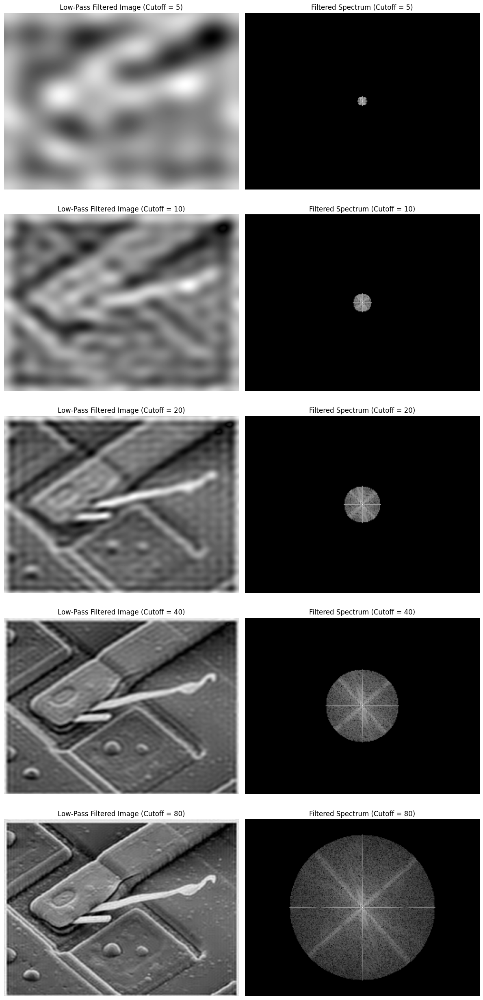

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift
from skimage import io, color

# Step 1: Load a custom image
image = io.imread("images2.jpeg")  # Load your custom image (replace with your image path)
image = color.rgb2gray(image)  # Convert to grayscale if the image is in RGB

# Step 2: Compute the 2D Fourier Transform of the image
ft_image = fft2(image)  # Compute 2D Fourier Transform

# Step 3: Shift the Fourier transform to center the low frequencies
ft_image_shifted = fftshift(ft_image)  # Shift low frequencies to the center

# Step 4: Compute the magnitude spectrum for visualization
magnitude_spectrum = np.log(1 + np.abs(ft_image_shifted))  # Log transform for better visualization

# Step 5: Apply low-pass filters with different cutoff frequencies and visualize results
cutoff_frequencies = [5, 10, 20, 40, 80]  # Different cutoff radii for the circular mask

# Create a figure with a row for each cutoff frequency (2 columns: filtered image and spectrum)
fig, ax = plt.subplots(len(cutoff_frequencies), 2, figsize=(12, len(cutoff_frequencies) * 5))

for i, cutoff_frequency in enumerate(cutoff_frequencies):
    rows, cols = image.shape  # Get the dimensions of the image
    crow, ccol = rows // 2, cols // 2  # Find the center of the frequency domain

    # Create a circular mask that keeps low frequencies (1 inside the circle, 0 outside)
    Y, X = np.ogrid[:rows, :cols]  # Create a grid of Y and X coordinates
    distance_from_center = np.sqrt((X - ccol)**2 + (Y - crow)**2)  # Compute distance from the center
    mask = np.zeros((rows, cols))  # Initialize the mask with zeros (block all frequencies)
    mask[distance_from_center <= cutoff_frequency] = 1  # Set frequencies within cutoff to one (keep low frequencies)

    # Apply the low-pass filter in the frequency domain
    ft_image_filtered = ft_image_shifted * mask  # Multiply the shifted Fourier Transform by the mask

    # Step 6: Inverse Fourier Transform to get the filtered image back in the spatial domain
    filtered_image = np.abs(ifft2(fftshift(ft_image_filtered)))  # Inverse FFT and take the magnitude

    # Show the low-pass filtered image (smooth)
    ax[i, 0].imshow(filtered_image, cmap='gray')  # Display the low-pass filtered image
    ax[i, 0].set_title(f'Low-Pass Filtered Image (Cutoff = {cutoff_frequency})')  # Title for filtered image
    ax[i, 0].axis('off')  # Turn off axes

    # Show the low-pass filtered Fourier spectrum
    ax[i, 1].imshow(np.log(1 + np.abs(ft_image_filtered)), cmap='gray')  # Display the filtered Fourier spectrum
    ax[i, 1].set_title(f'Filtered Spectrum (Cutoff = {cutoff_frequency})')  # Title for filtered spectrum
    ax[i, 1].axis('off')  # Turn off axes

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()  # Display the plots


# Power

Radius 10 encloses 86.99% of total power
Radius 30 encloses 93.08% of total power
Radius 60 encloses 95.67% of total power
Radius 160 encloses 97.77% of total power
Radius 460 encloses 99.18% of total power


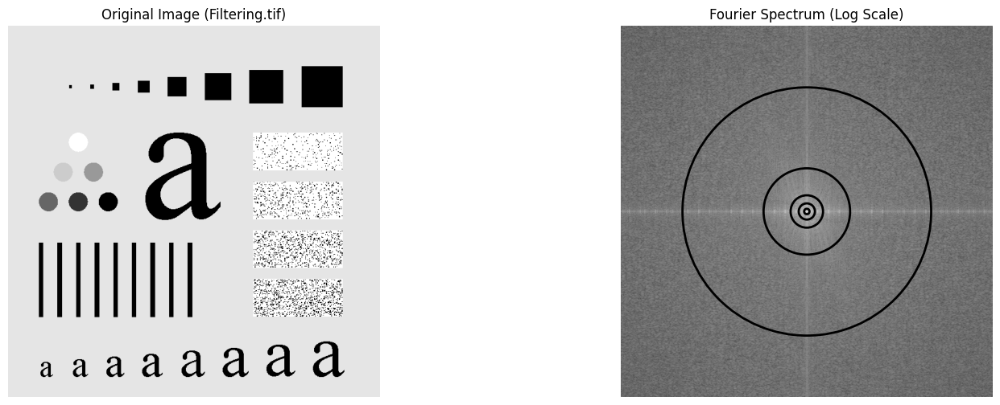

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, fftshift
from skimage import io, color

# Step 1: Load the "Filtering.tif" image and convert it to grayscale if necessary
image = io.imread("Filtering.tif")  # Load the image

# Convert to grayscale if the image is in color
if image.ndim == 3:  # Check if the image has 3 channels (RGB)
    image = color.rgb2gray(image)  # Convert to grayscale if it's a color image

# Step 2: Get the dimensions of the image
image_size = image.shape[0]  # Assuming the image is square (688x688), only take one dimension

# Step 3: Compute the Fourier Transform of the image
ft_image = fft2(image, s=[2 * image_size, 2 * image_size])  # Compute 2D Fourier Transform with zero-padding to double the size
ft_image_shifted = fftshift(ft_image)  # Shift the zero frequency component to the center of the spectrum for better visualization

# Step 4: Compute the Power Spectrum
power_spectrum = np.abs(ft_image_shifted)**2  # The power spectrum is the square of the magnitude of the Fourier Transform

# Step 5: Create circular masks for different radii (10, 30, 60, 160, 460)
radii = [10, 30, 60, 160, 460]  # Radii for the circular masks in the frequency domain
total_power = np.sum(power_spectrum)  # Calculate the total power in the entire spectrum
percentages = []  # List to store the percentage of power enclosed by each mask

# Create circular masks and calculate the enclosed power for each radius
rows, cols = power_spectrum.shape  # Get the shape of the power spectrum (double the size due to padding)
crow, ccol = rows // 2, cols // 2  # Find the center of the frequency domain (for circular mask)

for radius in radii:
    # Create a circular mask with the specified radius
    Y, X = np.ogrid[:rows, :cols]  # Create grid coordinates for all pixels
    dist_from_center = np.sqrt((X - ccol)**2 + (Y - crow)**2)  # Compute the distance of each pixel from the center
    mask = dist_from_center <= radius  # Create a boolean mask (True for pixels within the radius)

    # Calculate power enclosed within the mask (sum of power spectrum values within the mask)
    enclosed_power = np.sum(power_spectrum[mask])  # Sum the power inside the circular mask
    power_percentage = (enclosed_power / total_power) * 100  # Calculate the percentage of total power enclosed by the mask
    percentages.append(power_percentage)  # Store the result in the list

# Step 6: Plot the image, its spectrum, and the circular masks
fig, ax = plt.subplots(1, 2, figsize=(18, 6))  # Create a subplot with 2 columns (1 for image, 1 for spectrum)

# Original image
ax[0].imshow(image, cmap='gray')  # Display the original grayscale image
ax[0].set_title('Original Image (Filtering.tif)')  # Title for the original image
ax[0].axis('off')  # Turn off axes for a cleaner display

# Fourier Spectrum (Magnitude)
ax[1].imshow(np.log(1 + np.abs(ft_image_shifted)), cmap='gray')  # Log-scale display of the magnitude spectrum (Fourier Transform)
ax[1].set_title('Fourier Spectrum (Log Scale)')  # Title for the Fourier spectrum
ax[1].axis('off')  # Turn off axes for a cleaner display

# Show circular masks on the spectrum
for radius in radii:
    circle = plt.Circle((ccol, crow), radius, color='black', fill=False, lw=2)  # Create a black circle for each radius
    ax[1].add_artist(circle)  # Add the circle to the spectrum plot

# Step 7: Print the power percentages enclosed by the circles
for i, radius in enumerate(radii):
    print(f"Radius {radius} encloses {percentages[i]:.2f}% of total power")

plt.show()  # Display the plots


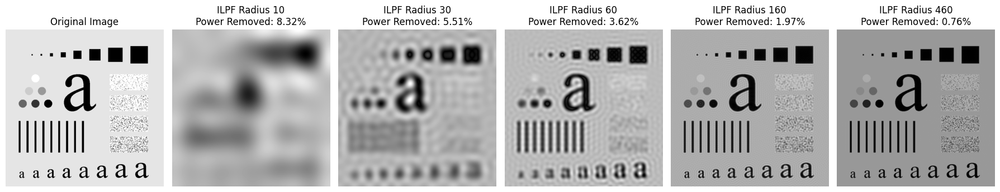

Radius 10: Removed 8.32% of the total power
Radius 30: Removed 5.51% of the total power
Radius 60: Removed 3.62% of the total power
Radius 160: Removed 1.97% of the total power
Radius 460: Removed 0.76% of the total power


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage import io, color

# Step 1: Load the image (use Filtering.tif or any image of size 688x688)
image = io.imread("Filtering.tif")

# Convert to grayscale if the image is in color
if image.ndim == 3:
    image = color.rgb2gray(image)

# Step 2: Mirror padding the image to avoid black borders (mirror padding doubles the size)
padded_image = np.pad(image, pad_width=image.shape[0]//2, mode='reflect')

# Step 3: Compute the Fourier Transform of the padded image
ft_image = fft2(padded_image)
ft_image_shifted = fftshift(ft_image)

# Step 4: Create ILPF (Ideal Low-Pass Filters) with different radii
radii = [10, 30, 60, 160, 460]
filtered_images = []
percent_removed_power = []

# Compute the Power Spectrum
power_spectrum = np.abs(ft_image_shifted)**2
total_power = np.sum(power_spectrum)

rows, cols = padded_image.shape
crow, ccol = rows // 2, cols // 2  # Center of the frequency domain

for radius in radii:
    # Create a circular mask for ILPF
    Y, X = np.ogrid[:rows, :cols]
    dist_from_center = np.sqrt((X - ccol)**2 + (Y - crow)**2)
    ilpf_mask = dist_from_center <= radius

    # Apply the ILPF mask in the frequency domain
    ft_image_filtered = ft_image_shifted * ilpf_mask

    # Inverse FFT to get the filtered image back in the spatial domain
    filtered_image = np.abs(ifft2(ifftshift(ft_image_filtered)))

    # Crop back to original size after filtering
    filtered_image_cropped = filtered_image[rows//4:rows//4+image.shape[0], cols//4:cols//4+image.shape[1]]

    # Calculate power removed by the filter
    removed_power = np.sum(power_spectrum * ~ilpf_mask)
    percent_power = (removed_power / total_power) * 100
    percent_removed_power.append(percent_power)

    # Append the filtered image for later display
    filtered_images.append(filtered_image_cropped)

# Step 5: Plot original image and filtered images
fig, ax = plt.subplots(1, len(radii) + 1, figsize=(18, 6))

# Plot original image
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

# Plot filtered images with different radii
for i, radius in enumerate(radii):
    ax[i + 1].imshow(filtered_images[i], cmap='gray')
    ax[i + 1].set_title(f'ILPF Radius {radius}\nPower Removed: {percent_removed_power[i]:.2f}%')
    ax[i + 1].axis('off')

plt.tight_layout()
plt.show()

# Step 6: Print the power percentages removed by each filter
for i, radius in enumerate(radii):
    print(f"Radius {radius}: Removed {percent_removed_power[i]:.2f}% of the total power")


# Gaussian Low-pass Filter (GLPS)

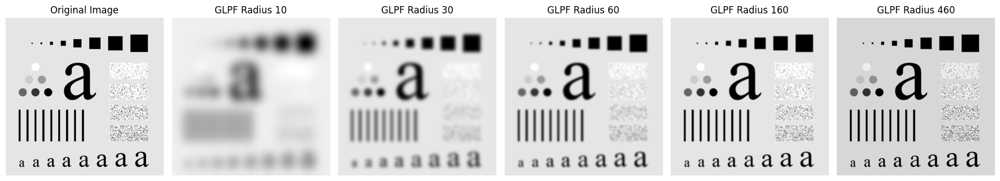

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage import io, color

# Step 1: Load the image (use Filtering.tif or any image of size 688x688)
image = io.imread("Filtering.tif")  # Load the image

# Convert to grayscale if the image is in color
if image.ndim == 3:  # Check if the image has multiple color channels (e.g., RGB)
    image = color.rgb2gray(image)  # Convert to grayscale if it's a color image

# Step 2: Mirror padding the image to avoid black borders (mirror padding doubles the size)
# Padding is done to avoid border artifacts that can occur when filtering in the frequency domain.
# 'Reflect' padding ensures that the edges of the image are mirrored, which helps preserve image details.
padded_image = np.pad(image, pad_width=image.shape[0]//2, mode='reflect')  # Apply mirror padding (reflect)

# Step 3: Compute the Fourier Transform of the padded image
# Fourier Transform (fft2) is applied to convert the image to the frequency domain.
# fftshift is used to move the zero-frequency components to the center of the spectrum.
ft_image = fft2(padded_image)  # Compute 2D Fourier Transform of the padded image
ft_image_shifted = fftshift(ft_image)  # Shift zero-frequency component to the center of the spectrum

# Step 4: Create GLPF (Gaussian Lowpass Filters) for different radii
# GLPF will smooth the image by allowing only low frequencies (corresponding to smooth regions) to pass.
radii = [10, 30, 60, 160, 460]  # Different cutoff radii for the Gaussian Lowpass Filters (GLPF)
filtered_images = []  # To store the filtered images

# Get the dimensions of the padded image and calculate the center coordinates
rows, cols = padded_image.shape  # Get the size of the padded image
crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain (for creating filters)

# Loop through each radius (D0) to create a Gaussian Lowpass Filter and apply it
for D0 in radii:
    # Create a Gaussian Lowpass Filter (GLPF) in the frequency domain
    # The filter is centered at the origin (the center of the frequency domain), and D0 defines the cutoff radius
    Y, X = np.ogrid[:rows, :cols]  # Create a grid for pixel coordinates
    D = np.sqrt((X - ccol)**2 + (Y - crow)**2)  # Compute the distance from the center for each pixel
    glpf_mask = np.exp(-(D**2) / (2 * (D0**2)))  # Gaussian function to create the lowpass filter

    # Apply the GLPF mask to the Fourier-transformed image
    # This effectively removes high-frequency components, resulting in a smoother image.
    ft_image_filtered = ft_image_shifted * glpf_mask  # Apply the Gaussian mask in the frequency domain

    # Perform the Inverse Fourier Transform to convert the image back to the spatial domain
    filtered_image = np.abs(ifft2(ifftshift(ft_image_filtered)))  # Inverse FFT to return to spatial domain

    # Crop back to the original size after filtering
    # Since we padded the image earlier, we now crop the filtered image to the original image size.
    filtered_image_cropped = filtered_image[rows//4:rows//4+image.shape[0], cols//4:cols//4+image.shape[1]]

    # Append the cropped filtered image to the list for later visualization
    filtered_images.append(filtered_image_cropped)

# Step 5: Plot original image and filtered images
# Display the original image and the filtered images side by side for comparison
fig, ax = plt.subplots(1, len(radii) + 1, figsize=(18, 6))  # Create a subplot with 1 row and columns based on the number of images

# Plot the original image
ax[0].imshow(image, cmap='gray')  # Display the original grayscale image
ax[0].set_title('Original Image')  # Title for the original image
ax[0].axis('off')  # Turn off the axes for a cleaner display

# Plot the filtered images corresponding to each GLPF radius
for i, D0 in enumerate(radii):
    ax[i + 1].imshow(filtered_images[i], cmap='gray')  # Display the filtered image
    ax[i + 1].set_title(f'GLPF Radius {D0}')  # Set the title indicating the filter radius
    ax[i + 1].axis('off')  # Turn off the axes for a cleaner display

# Adjust layout and show the plot
plt.tight_layout()  # Adjust the layout to prevent overlap of titles and images
plt.show()  # Display the final plots


# Butterworth Low-pass Filter (BLPF)

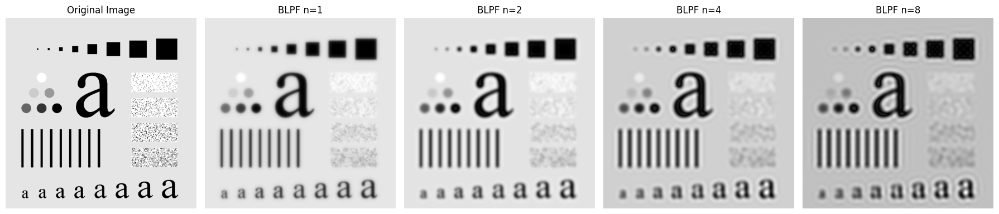

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage import io, color

# Step 1: Load the image (use Filtering.tif or any image of size 688x688)
image = io.imread("Filtering.tif")

# Convert to grayscale if the image is in color
if image.ndim == 3:
    image = color.rgb2gray(image)

# Step 2: Mirror padding the image to avoid black borders (mirror padding doubles the size)
padded_image = np.pad(image, pad_width=image.shape[0]//2, mode='reflect')

# Step 3: Compute the Fourier Transform of the padded image
ft_image = fft2(padded_image)
ft_image_shifted = fftshift(ft_image)

# Step 4: Create BLPF (Butterworth Lowpass Filter) for different n factors
radii = [60]  # Keep the radius constant at 60 for this test
n_factors = [1, 2, 4, 8]  # Different n factors to show how sharpness changes

filtered_images = []

rows, cols = padded_image.shape
crow, ccol = rows // 2, cols // 2  # Center of the frequency domain

# Loop through each n factor and create a Butterworth Lowpass Filter for each
for n in n_factors:
    for D0 in radii:
        # Create a Butterworth Lowpass Filter
        Y, X = np.ogrid[:rows, :cols]
        D = np.sqrt((X - ccol)**2 + (Y - crow)**2)
        blpf_mask = 1 / (1 + (D / D0)**(2 * n))

        # Apply the BLPF mask in the frequency domain
        ft_image_filtered = ft_image_shifted * blpf_mask

        # Inverse FFT to get the filtered image back in the spatial domain
        filtered_image = np.abs(ifft2(ifftshift(ft_image_filtered)))

        # Crop back to original size after filtering
        filtered_image_cropped = filtered_image[rows//4:rows//4+image.shape[0], cols//4:cols//4+image.shape[1]]

        # Append the filtered image for later display
        filtered_images.append((filtered_image_cropped, n))

# Step 5: Plot original image and filtered images for different n factors
fig, ax = plt.subplots(1, len(n_factors) + 1, figsize=(18, 6))

# Plot original image
ax[0].imshow(image, cmap='gray')
ax[0].set_title('Original Image')
ax[0].axis('off')

# Plot filtered images with different n factors
for i, (filtered_image, n) in enumerate(filtered_images):
    ax[i + 1].imshow(filtered_image, cmap='gray')
    ax[i + 1].set_title(f'BLPF n={n}')
    ax[i + 1].axis('off')

plt.tight_layout()
plt.show()


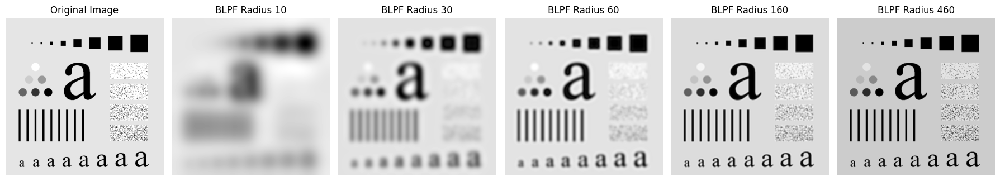

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft2, ifft2, fftshift, ifftshift
from skimage import io, color

# Step 1: Load the image (use Filtering.tif or any image of size 688x688)
# Load the image using skimage's imread function. If the image is not grayscale, convert it to grayscale.
image = io.imread("Filtering.tif")  # Load the image file

# Convert to grayscale if the image is in color
# Check if the image has 3 dimensions (e.g., RGB channels). If so, convert it to grayscale.
if image.ndim == 3:
    image = color.rgb2gray(image)  # Convert to grayscale

# Step 2: Mirror padding the image to avoid black borders (mirror padding doubles the size)
# To avoid artifacts at the edges after filtering, mirror padding is applied. This enlarges the image by reflecting
# the original content across the borders. It helps preserve boundary information during frequency domain filtering.
padded_image = np.pad(image, pad_width=image.shape[0]//2, mode='reflect')  # Apply mirror padding

# Step 3: Compute the Fourier Transform of the padded image
# Fourier Transform is applied to convert the padded image to the frequency domain.
# fftshift is used to shift the zero frequency to the center of the spectrum for better visualization and filtering.
ft_image = fft2(padded_image)  # Compute the 2D Fourier Transform of the padded image
ft_image_shifted = fftshift(ft_image)  # Shift the zero frequency component to the center

# Step 4: Create BLPF (Butterworth Lowpass Filter) for different radii
# Different cutoff radii (D0) for the Butterworth Lowpass Filters are used to allow lower frequencies (smooth areas)
# and attenuate high-frequency components (sharp edges/noise).
radii = [10, 30, 60, 160, 460]  # Define radii for the BLPF cutoff frequencies
n = 2.25  # Order of the Butterworth filter (controls the smoothness of the transition)

filtered_images = []  # List to store filtered images

# Get the dimensions of the padded image and calculate the center of the frequency domain
rows, cols = padded_image.shape  # Get the size of the padded image
crow, ccol = rows // 2, cols // 2  # Calculate the center of the frequency domain

# Loop through each radius (D0) and create the corresponding Butterworth Lowpass Filter
for D0 in radii:
    # Create a Butterworth Lowpass Filter (BLPF)
    # D is the distance of each point from the center of the frequency domain.
    # The Butterworth filter is defined as 1 / (1 + (D/D0)^(2*n)), where D0 is the cutoff radius, and n is the filter order.
    Y, X = np.ogrid[:rows, :cols]  # Create a grid of pixel coordinates
    D = np.sqrt((X - ccol)**2 + (Y - crow)**2)  # Compute the distance from the center of the frequency domain
    blpf_mask = 1 / (1 + (D / D0)**(2 * n))  # Create the Butterworth Lowpass Filter

    # Apply the BLPF mask to the Fourier-transformed image
    # The filter removes high frequencies while retaining low frequencies based on the cutoff radius.
    ft_image_filtered = ft_image_shifted * blpf_mask  # Apply the BLPF mask to the Fourier-transformed image

    # Inverse FFT to get the filtered image back in the spatial domain
    # Apply inverse Fourier Transform to return the filtered image to the spatial domain.
    filtered_image = np.abs(ifft2(ifftshift(ft_image_filtered)))  # Apply inverse FFT

    # Crop back to original size after filtering
    # After filtering, crop the image back to its original size by removing the padded areas.
    filtered_image_cropped = filtered_image[rows//4:rows//4+image.shape[0], cols//4:cols//4+image.shape[1]]

    # Append the filtered image to the list for later display
    filtered_images.append(filtered_image_cropped)  # Save the cropped filtered image

# Step 5: Plot original image and filtered images
# Visualize the original image and the filtered images for each Butterworth filter radius.
# Each image will be displayed side by side for comparison.
fig, ax = plt.subplots(1, len(radii) + 1, figsize=(18, 6))  # Create subplots with one row and multiple columns

# Plot original image
ax[0].imshow(image, cmap='gray')  # Display the original grayscale image
ax[0].set_title('Original Image')  # Set the title for the original image
ax[0].axis('off')  # Turn off the axis for a cleaner display

# Plot the filtered images with different radii
for i, D0 in enumerate(radii):
    ax[i + 1].imshow(filtered_images[i], cmap='gray')  # Display the filtered image
    ax[i + 1].set_title(f'BLPF Radius {D0}')  # Set the title to indicate the filter radius
    ax[i + 1].axis('off')  # Turn off the axis for a cleaner display

plt.tight_layout()  # Adjust the layout to avoid overlap between images and titles
plt.show()  # Show the final plot


# Ideal/Gaussian/Butterworth High-pass Filters

<ipython-input-22-748d5ad672fe>:21: RuntimeWarning: divide by zero encountered in divide
  h = 1 / (1 + (cutoff / distance)**(2 * n))


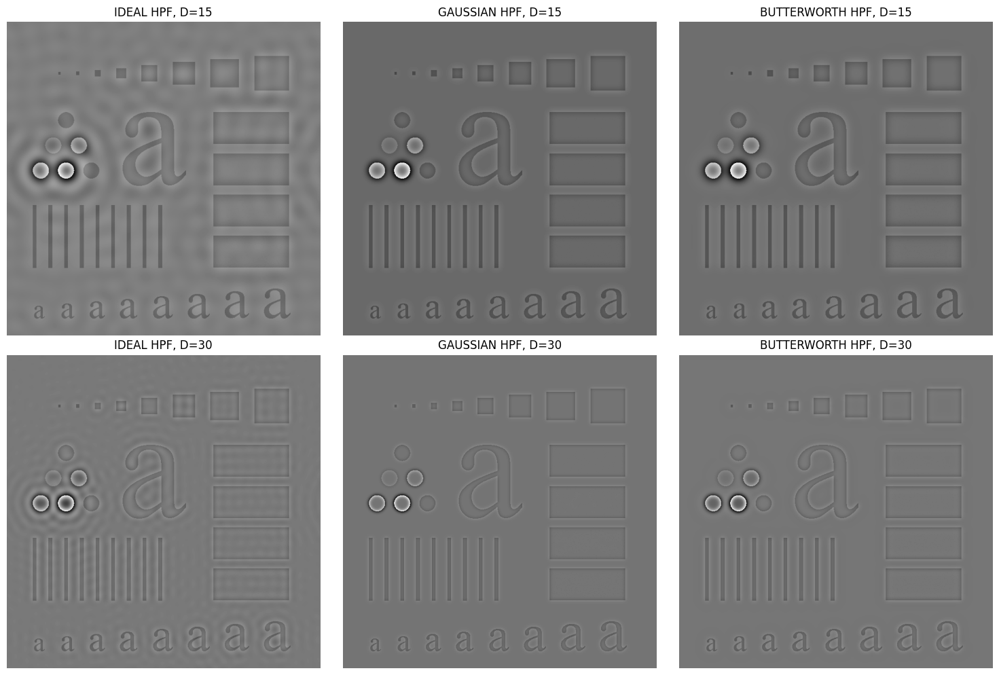

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from scipy.fft import fft2, ifft2, fftshift, ifftshift

def create_highpass_filter(shape, cutoff, filter_type='ideal', n=2):
    """Creates a highpass filter based on the specified type."""
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2  # Center of the image
    x, y = np.ogrid[:rows, :cols]

    # Distance from the center
    distance = np.sqrt((x - crow)**2 + (y - ccol)**2)

    if filter_type == 'ideal':
        h = np.zeros((rows, cols))
        h[distance > cutoff] = 1
    elif filter_type == 'gaussian':
        h = 1 - np.exp(-(distance**2) / (2 * (cutoff**2)))
    elif filter_type == 'butterworth':
        h = 1 / (1 + (cutoff / distance)**(2 * n))
        h[distance == 0] = 0  # Avoid division by zero
    else:
        raise ValueError("Unknown filter type: choose 'ideal', 'gaussian', or 'butterworth'.")

    return h

def highpass_filter(image, cutoff, filter_type='ideal', n=2):
    """Applies the highpass filter to the image in the frequency domain."""
    # Compute the Fourier Transform of the image
    ft_image = fft2(image)
    ft_image_shifted = fftshift(ft_image)  # Shift zero frequency to center

    # Create the highpass filter
    hp_filter = create_highpass_filter(image.shape, cutoff, filter_type, n)

    # Apply the filter
    filtered_image = ft_image_shifted * hp_filter

    # Inverse Fourier Transform to get the filtered image
    filtered_image = ifft2(ifftshift(filtered_image))
    return np.real(filtered_image)

def scale_image(image):
    """Scale the image to the range [0, 255] for visualization."""
    min_val = np.min(image)
    max_val = np.max(image)
    scaled_image = 255 * (image - min_val) / (max_val - min_val)
    return scaled_image.astype(np.uint8)

# Load the test pattern image (update the path accordingly)
test_pattern_image = io.imread("Filtering.tif", as_gray=True)  # Replace with your image path
test_pattern_image = (test_pattern_image * 255).astype(np.uint8)  # Convert to uint8 if needed

# Define cutoff frequencies
cutoffs = [15, 30]  # Example cutoff frequencies
filter_types = ['ideal', 'gaussian', 'butterworth']

# Create and display the filtered images
fig, ax = plt.subplots(2, 3, figsize=(15, 10))

for i, cutoff in enumerate(cutoffs):
    for j, filter_type in enumerate(filter_types):
        filtered_image = highpass_filter(test_pattern_image, cutoff, filter_type)

        # Scale the filtered image for visualization
        scaled_image = scale_image(filtered_image)

        # Displaying the filtered and scaled image
        ax[i, j].imshow(scaled_image, cmap='gray', vmin=0, vmax=255)
        ax[i, j].set_title(f'{filter_type.upper()} HPF, D={cutoff}')
        ax[i, j].axis('off')

plt.tight_layout()
plt.show()


# Laplacian Filter

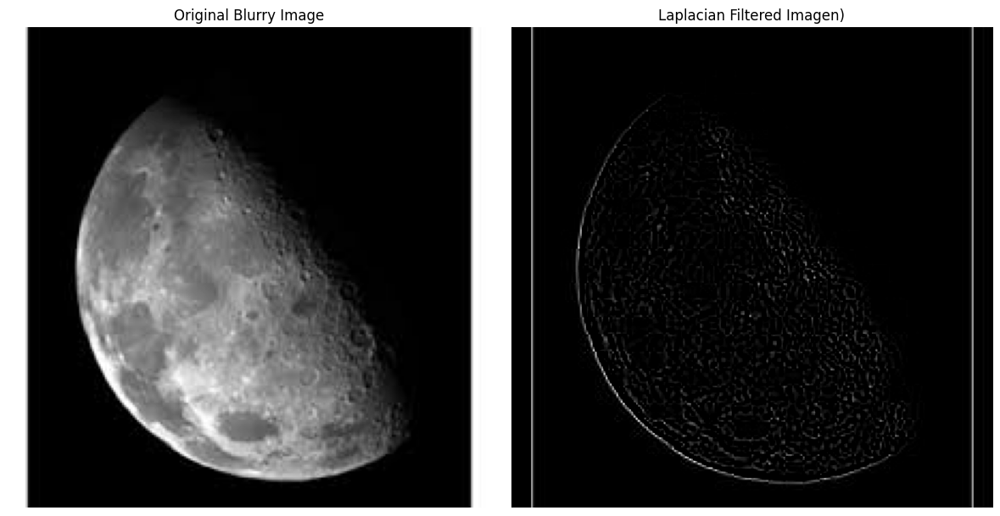

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, color
from scipy.fft import fft2, ifft2, fftshift, ifftshift

def laplacian_filter(shape):
    """Create a Laplacian filter in the frequency domain."""
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2  # Center of the image
    x, y = np.ogrid[:rows, :cols]

    # Calculate the Laplacian filter in the frequency domain
    laplacian_filter = -4 * (np.sin((np.pi * (x - crow) / rows))**2 + np.sin((np.pi * (y - ccol) / cols))**2)

    return laplacian_filter

def apply_laplacian(image):
    """Apply the Laplacian filter to the image in the frequency domain."""
    # Compute the Fourier Transform of the image
    ft_image = fft2(image)
    ft_image_shifted = fftshift(ft_image)  # Shift zero frequency to center

    # Create the Laplacian filter
    lap_filter = laplacian_filter(image.shape)

    # Apply the Laplacian filter in the frequency domain
    filtered_image = ft_image_shifted * lap_filter

    # Inverse Fourier Transform to get the filtered image in the spatial domain
    laplacian_image = ifft2(ifftshift(filtered_image))
    laplacian_image = np.real(laplacian_image)

    return laplacian_image

# Load the original image (update the path accordingly)
image = io.imread("images1.jpeg", as_gray=True)  # Replace with your image path
image = (image * 255).astype(np.uint8)  # Convert to uint8 if needed

# Apply Laplacian filter
laplacian_image = apply_laplacian(image)

# Display the original and sharpened images
fig, ax = plt.subplots(1, 2, figsize=(12, 6))
ax[0].imshow(blurry_image, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Original Blurry Image')
ax[0].axis('off')

ax[1].imshow(laplacian_image, cmap='gray', vmin=0, vmax=255)
ax[1].set_title('Laplacian Filtered Imagen)')
ax[1].axis('off')



plt.tight_layout()
plt.show()

# Laplacian of Gaussian (LoG)

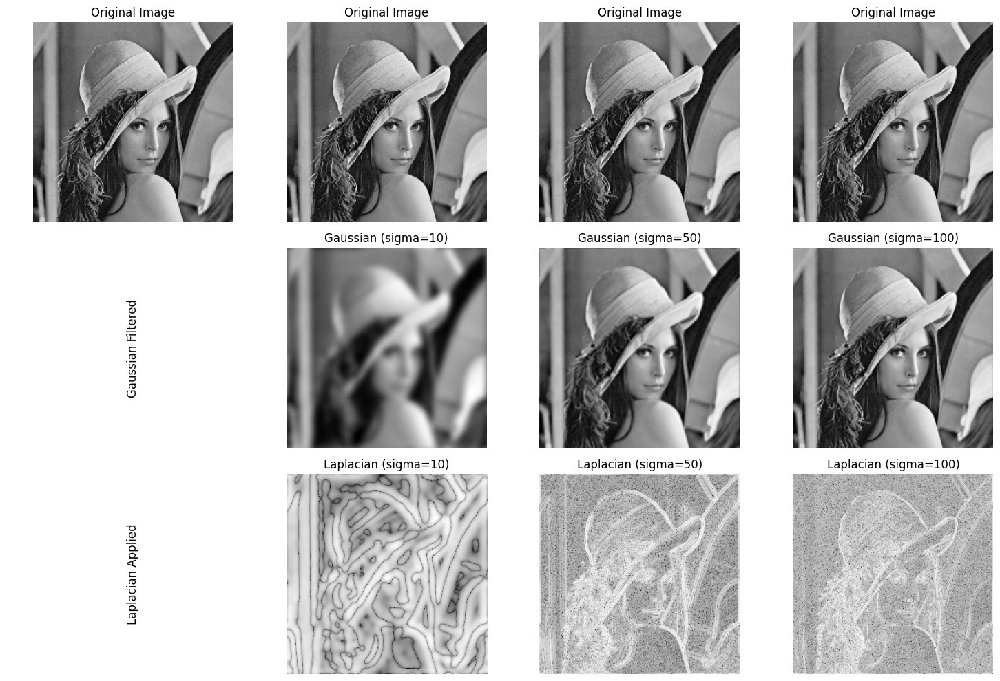

In [16]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def computeFFT(image):
    """Compute the 2D FFT of an image."""
    return np.fft.fft2(image)

def computeInverseFFT(fft_image):
    """Compute the 2D inverse FFT of an image."""
    return np.fft.ifft2(fft_image)

def normalize2DDFTByLog(image):
    """Normalize the DFT output for visualization."""
    magnitude = np.abs(image)
    magnitude = np.log(1 + magnitude)  # Log scale
    return magnitude / np.max(magnitude)  # Normalize to [0, 1]

def constructDuv(N):
    """Construct the frequency matrix, D(u,v), of size NxN."""
    u = np.arange(N)
    v = np.arange(N)

    u[u > N // 2] -= N
    v[v > N // 2] -= N

    V, U = np.meshgrid(v, u)
    D = np.sqrt(U**2 + V**2)

    return D

def computeLaplacian(Duv):
    """Compute the Laplacian operator in the Frequency Domain."""
    return -1 * (Duv ** 2)

def computeGaussian(Duv, sigma):
    """Compute the Gaussian operator in the Frequency Domain."""
    gausExp = 0.5 * (Duv ** 2) / (sigma ** 2)
    return np.exp(-gausExp)

def applyGaussianFilter(fftImge, Duv, sigma):
    """Apply the Gaussian filter in the frequency domain."""
    gaus = computeGaussian(Duv, sigma)
    return gaus * fftImge

def applyLaplacian(fftImge, Duv):
    """Apply the Laplacian filter in the frequency domain."""
    lap = computeLaplacian(Duv)
    return lap * fftImge

# Load the image
image = Image.open("images4.tif")  # Open an image
image = np.array(image)

sigmas = [10, 50, 100]  # Define different sigma values
N = image.shape[0]  # Assume square image
F = computeFFT(image)
Duv = constructDuv(N)

gaussian_images = []
laplacian_images = []

# Apply Gaussian and Laplacian filters for each sigma
for sigma in sigmas:
    # Apply Gaussian filter
    gaus_filtered_fft = applyGaussianFilter(F, Duv, sigma)
    gaussian_images.append(computeInverseFFT(gaus_filtered_fft))

    # Apply Laplacian filter after Gaussian
    laplacian_filtered_fft = applyLaplacian(gaus_filtered_fft, Duv)
    laplacian_images.append(computeInverseFFT(laplacian_filtered_fft))

# Display the original, Gaussian filtered, and Laplacian filtered images
fig, axarr = plt.subplots(3, len(sigmas) + 1, figsize=(15, 10))

# Display the original image in the first column
for i in range(len(sigmas) + 1):
    axarr[0, i].imshow(image, cmap='gray')
    axarr[0, i].set_title('Original Image' if i == 0 else f'Original Image')
    axarr[0, i].axis('off')

# Display Gaussian filtered images
for i in range(len(sigmas)):
    axarr[1, i + 1].imshow(np.abs(gaussian_images[i]), cmap='gray')
    axarr[1, i + 1].set_title(f'Gaussian (sigma={sigmas[i]})')
    axarr[1, i + 1].axis('off')

# Display Laplacian applied images after Gaussian filtering
for i in range(len(sigmas)):
    axarr[2, i + 1].imshow(normalize2DDFTByLog(laplacian_images[i]), cmap='gray')
    axarr[2, i + 1].set_title(f'Laplacian (sigma={sigmas[i]})')
    axarr[2, i + 1].axis('off')

# Add labels for Gaussian and Laplacian rows
axarr[1, 0].axis('off')
axarr[1, 0].text(0.5, 0.5, 'Gaussian Filtered', va='center', ha='center', rotation=90, fontsize=12)

axarr[2, 0].axis('off')
axarr[2, 0].text(0.5, 0.5, 'Laplacian Applied', va='center', ha='center', rotation=90, fontsize=12)

plt.tight_layout()
plt.show()


Image loaded successfully. Shape: (195, 259)


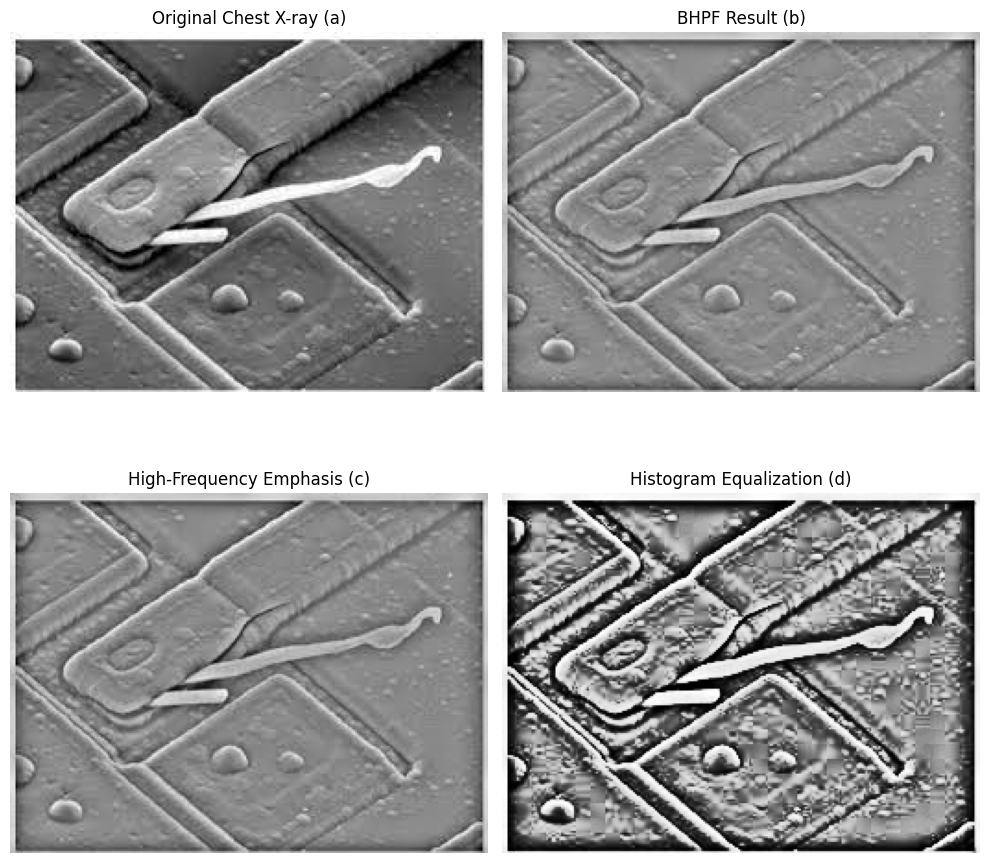

In [31]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io, exposure
from scipy.fft import fft2, ifft2, fftshift, ifftshift

def butterworth_highpass_filter(shape, cutoff, order=2):
    """Create a Butterworth Highpass Filter."""
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2  # Center of the image
    x = np.ogrid[:rows, :cols]

    # Distance from the center
    d = np.sqrt((x[0] - crow)**2 + (x[1] - ccol)**2)

    # Butterworth Highpass Filter
    hp_filter = 1 / (1 + (cutoff / (d + 1e-6)) ** (2 * order))  # Prevent division by zero
    return hp_filter

def highpass_filter_image(image, cutoff, filter_type='butterworth', order=2):
    """Apply a highpass filter to the image."""
    # Compute the Fourier Transform of the image
    ft_image = fft2(image)
    ft_image_shifted = fftshift(ft_image)  # Shift zero frequency to center

    # Create the appropriate Highpass Filter
    if filter_type == 'butterworth':
        hp_filter = butterworth_highpass_filter(image.shape, cutoff, order)
    else:
        raise ValueError("Unknown filter type")

    # Apply the highpass filter
    filtered_image = ft_image_shifted * hp_filter

    # Inverse Fourier Transform to get the sharpened image
    sharpened_image = ifft2(ifftshift(filtered_image))
    sharpened_image = np.real(sharpened_image)

    # Scale to range [0, 255]
    min_val = np.min(sharpened_image)
    max_val = np.max(sharpened_image)
    sharpened_image = 255 * (sharpened_image - min_val) / (max_val - min_val)

    return sharpened_image.astype(np.uint8)

def high_frequency_emphasis_filter(image, cutoff, k):
    """Apply High-Frequency Emphasis Filter."""
    # Apply Butterworth Highpass Filter
    hp_image = highpass_filter_image(image, cutoff)

    # Emphasize high frequencies
    emphasized_image = image + k * hp_image

    # Scale the emphasized image
    min_val = np.min(emphasized_image)
    max_val = np.max(emphasized_image)
    emphasized_image = 255 * (emphasized_image - min_val) / (max_val - min_val)

    return emphasized_image.astype(np.uint8)

# Load the original chest X-ray image (update the path accordingly)
xray_image = io.imread("images2.jpeg", as_gray=True)  # Replace with your image path
if xray_image is None or xray_image.size == 0:
    print("Failed to load image.")
else:
    print("Image loaded successfully. Shape:", xray_image.shape)

# Parameters
cutoff = 10  # D0 value for Butterworth Highpass Filter
k = 0.2      # High-frequency emphasis k value

# (a) Original X-ray Image
# Already loaded above as xray_image

# (b) Apply Butterworth Highpass Filtering
bhpf_result = highpass_filter_image(xray_image, cutoff, filter_type='butterworth', order=2)

# (c) Apply High-Frequency Emphasis Filtering
high_freq_emphasis_result = high_frequency_emphasis_filter(xray_image, cutoff, k)

# (d) Apply Histogram Equalization on the emphasized image
equalized_result = exposure.equalize_hist(high_freq_emphasis_result)

# Display Results
fig, ax = plt.subplots(2, 2, figsize=(10, 10))

# Original Image (a)
ax[0, 0].imshow(xray_image, cmap='gray')
ax[0, 0].set_title('Original Chest X-ray (a)')
ax[0, 0].axis('off')

# Butterworth Highpass Filter Result (b)
ax[0, 1].imshow(bhpf_result, cmap='gray')
ax[0, 1].set_title('BHPF Result (b)')
ax[0, 1].axis('off')

# High-Frequency Emphasis Filter Result (c)
ax[1, 0].imshow(high_freq_emphasis_result, cmap='gray')
ax[1, 0].set_title('High-Frequency Emphasis (c)')
ax[1, 0].axis('off')

# Histogram Equalization Result (d)
ax[1, 1].imshow(equalized_result, cmap='gray')
ax[1, 1].set_title('Histogram Equalization (d)')
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()
